In [1]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scvi
from matplotlib_venn import venn2

from utils import enrich, enrichr

Global seed set to 0


In [2]:
sc.set_figure_params(dpi=100, frameon=False, color_map='Reds', facecolor=None)
sc.logging.print_header()

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
2022-04-06 19:10:38.139936: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-04-06 19:10:38.139979: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


scanpy==1.8.2 anndata==0.7.6 umap==0.5.2 numpy==1.20.3 scipy==1.5.3 pandas==1.3.4 scikit-learn==1.0.2 statsmodels==0.11.1 python-igraph==0.8.3 leidenalg==0.8.3 pynndescent==0.5.5


In [3]:
adata = sc.read('2022-03-30_covid_fischer_scanvi_subset.h5ad')

In [4]:
covid = adata[adata.obs.batch_data != 'fischer']
covid

View of AnnData object with n_obs × n_vars = 221974 × 18023
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'patients', 'sample_ID', 'data_set', 'severity', 'location', 'condition', 'age', 'sex', 'virus_positive', 'PBMC_leiden_29', 'patient_category', 'reactive_clonotype', 'published_meta_celltype', 'published_celltype', 'harmonized_celltype', 'T_cell_type', 'size_factors', 'pct_mitochondrial', 'severity_virus'
    var: 'used_for_scvi-0', 'highly_variable-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [6]:
fischer = adata[adata.obs.batch_data == 'fischer']
fischer

View of AnnData object with n_obs × n_vars = 62326 × 18023
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'patients', 'sample_ID', 'data_set', 'severity', 'location', 'condition', 'age', 'sex', 'virus_positive', 'PBMC_leiden_29', 'patient_category', 'reactive_clonotype', 'published_meta_celltype', 'published_celltype', 'harmonized_celltype', 'T_cell_type', 'size_factors', 'pct_mitochondrial', 'severity_virus'
    var: 'used_for_scvi-0', 'highly_variable-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

## Filter data

In [9]:
adata = adata[(adata.obs.treatment == 'mock') | (adata.obs.batch_data == 'fischer')]
adata

View of AnnData object with n_obs × n_vars = 93578 × 18023
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'patients', 'sample_ID', 'data_set', 'severity', 'location', 'condition', 'age', 'sex', 'virus_positive', 'PBMC_leiden_29', 'patient_category', 'reactive_clonotype', 'published_meta_celltype', 'published_celltype', 'harmonized_celltype', 'T_cell_type', 'size_factors', 'pct_mitochondrial', 'severity_virus'
    var: 'used_for_scvi-0', 'highly_variable-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

Check that it's evenly distributed:

In [10]:
pd.crosstab(adata.obs.infected, adata.obs.patient)

patient,patient_1,patient_2,patient_3,patient_4
infected,,,,
False,3393,3393,4490,3627
True,3904,1666,6180,4599


## learn infection genes "manually" with a linear classifier

In [11]:
from sklearn.linear_model import LogisticRegression

In [12]:
%%time
clf = LogisticRegression(solver='saga')

subset = adata[adata.obs.batch_data != 'fischer']  # covid data only
clf.fit(subset.X.toarray(), subset.obs.infected.values)
clf.classes_

CPU times: user 8min 35s, sys: 9.61 s, total: 8min 44s
Wall time: 8min 46s


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


array(['False', 'True'], dtype=object)

Check performance on training data.

In [13]:
clf.score(subset.X.toarray(), subset.obs.infected.values)

0.8503775758351465

A fairly subtle signal.

## scanvi label transfer with gene subset

Instead of training and trying to integrate on highly variable genes, we'll instead subset the data to the set of genes which were the strongest markers for IFNL.

Trying to set attribute `.var` of view, copying.


Text(0.5, 1.0, 'LR weights, infection classif')

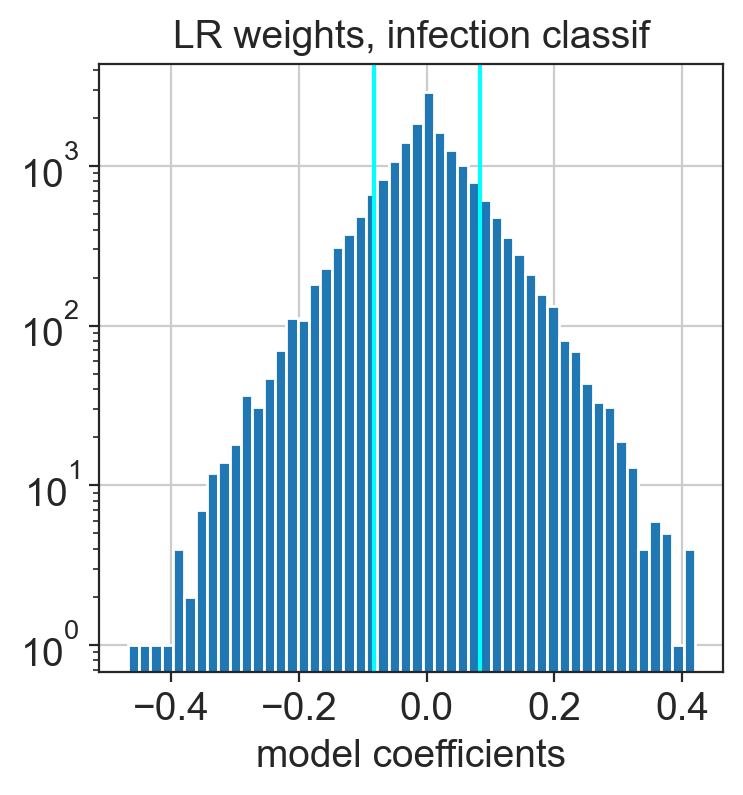

In [15]:
from external_utils import define_marker_genes

define_marker_genes(adata, clf)
plt.title('LR weights, infection classif')

The shape of this distribution indicates that there were relatively few significant markers.

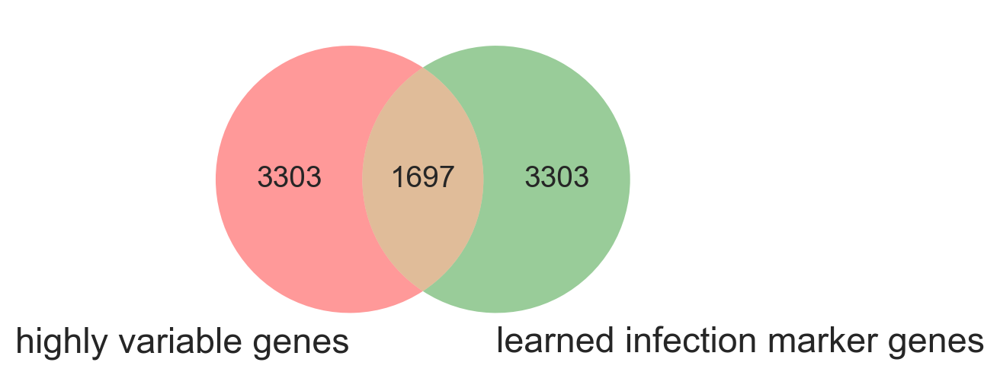

In [16]:
venn2(
    [set(adata.var_names[adata.var['highly_variable']]), set(adata.var_names[adata.var['marker_genes']])], 
    set_labels=['highly variable genes', 'learned infection marker genes']
)

Subset.

In [17]:
adata = adata[:, adata.var['marker_genes'] == True]
adata

View of AnnData object with n_obs × n_vars = 93578 × 5000
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'patients', 'sample_ID', 'data_set', 'severity', 'location', 'condition', 'age', 'sex', 'virus_positive', 'PBMC_leiden_29', 'patient_category', 'reactive_clonotype', 'published_meta_celltype', 'published_celltype', 'harmonized_celltype', 'T_cell_type', 'size_factors', 'pct_mitochondrial', 'severity_virus'
    var: 'used_for_scvi-0', 'highly_variable-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'coef', 'marker_genes'
    uns: 'hvg'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [21]:
# set unknown label for scanvi
adata.obs["infected_scanvi"] = 'Unknown'
fischer_idx = adata.obs['batch_data'] != "fischer"
adata.obs["infected_scanvi"][fischer_idx] = adata.obs.infected[fischer_idx]

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [22]:
scvi.model.SCANVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="batch_data",
    labels_key="infected_scanvi",
)

INFO     Using batches from adata.obs["batch_data"]                                          
INFO     Using labels from adata.obs["infected_scanvi"]                                      
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 93578 cells, 5000 vars, 5 batches,
         3 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


### Train

In [23]:
arches_params = dict(
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
    n_latent=30,
)

lvae_lr = scvi.model.SCANVI(adata, "Unknown", **arches_params)
lvae_lr.train(early_stopping=True, max_epochs=40)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scvi/model/base/_base_model.py:151: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  "Make sure the registered X field in anndata contains unnormalized count data."


INFO     Training for 40 epochs.                                                             


GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 1/40:   0%|                                                                                                                                                                                                                    | 0/40 [00:00<?, ?it/s]

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scvi/distributions/_negative_binomial.py:435: UserWarning: The value argument must be within the support of the distribution
  UserWarning,


Epoch 40/40: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [35:35<00:00, 53.39s/it, loss=1.02e+03, v_num=1]


In [24]:
lvae_lr.module

SCANVAE(
  (z_encoder): Encoder(
    (encoder): FCLayers(
      (fc_layers): Sequential(
        (Layer 0): Sequential(
          (0): Linear(in_features=5005, out_features=128, bias=True)
          (1): None
          (2): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
          (3): ReLU()
          (4): Dropout(p=0.2, inplace=False)
        )
        (Layer 1): Sequential(
          (0): Linear(in_features=133, out_features=128, bias=True)
          (1): None
          (2): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
          (3): ReLU()
          (4): Dropout(p=0.2, inplace=False)
        )
      )
    )
    (mean_encoder): Linear(in_features=128, out_features=30, bias=True)
    (var_encoder): Linear(in_features=128, out_features=30, bias=True)
  )
  (l_encoder): Encoder(
    (encoder): FCLayers(
      (fc_layers): Sequential(
        (Layer 0): Sequential(
          (0): Linear(in_features=5005, out_features=128, bias=True)
          (1): None
          (2): La

Save the model.

In [25]:
lvae_lr.save('2022-03-30_scanvi_infection_genes_fischer_map', overwrite=True, save_anndata=True)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'treatment_scanvi' as categorical
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'infected_scanvi' as categorical


### Predict

In [27]:
adata.obs["infected_predicted"] = lvae_lr.predict(adata)
adata.obsm["X_scANVI"] = lvae_lr.get_latent_representation(adata)

In [28]:
%%time
sc.pp.neighbors(adata, use_rep="X_scANVI")
sc.tl.umap(adata)

CPU times: user 5min 16s, sys: 9.85 s, total: 5min 26s
Wall time: 2min 19s


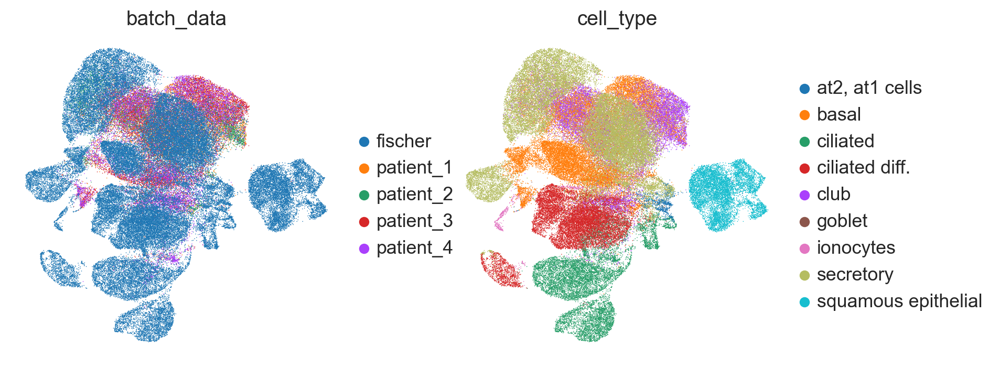

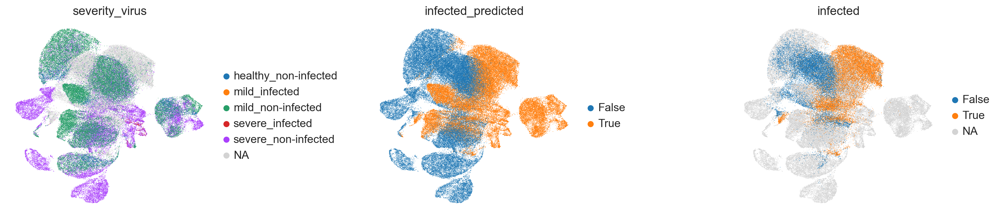

In [32]:
sc.pl.umap(adata, color=['batch_data', 'cell_type'])
sc.pl.umap(adata, color=['severity_virus', 'infected_predicted', 'infected'], wspace=.6)

Map back to fischer.

In [33]:
fischer.obs['infected_predicted'] = adata[adata.obs.batch_data == 'fischer'].obs['infected_predicted'].values

Trying to set attribute `.obs` of view, copying.


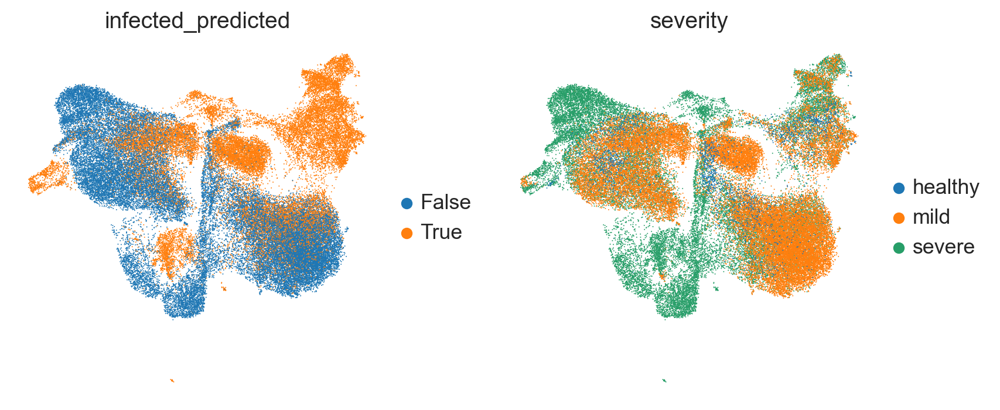

In [37]:
sc.pl.umap(fischer, color=['infected_predicted', 'severity'])

### Predict proba

We'll now try to get a better interpretation by using the probabilities directly.

In [38]:
z1 = lvae_lr.get_latent_representation()
preds = lvae_lr.module.classifier(torch.from_numpy(z1)).detach().numpy()
preds.shape

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scvi/model/base/_base_model.py:151: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  "Make sure the registered X field in anndata contains unnormalized count data."


(93578, 2)

In [39]:
for i in range(preds.shape[1]):
    adata.obs[f'classifier_proba_{adata.obs.infected.cat.categories[i]}'] = preds[:, i]

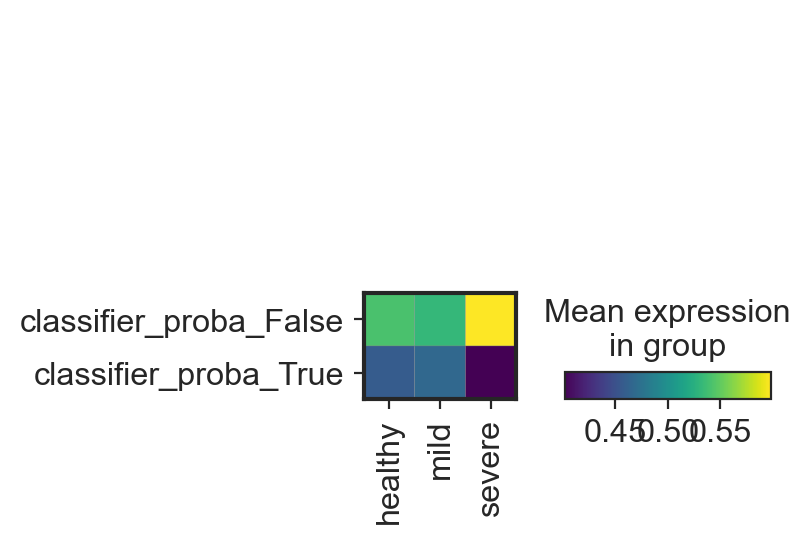

In [41]:
sc.pl.matrixplot(
    adata[adata.obs.batch_data == 'fischer'],
    groupby=['severity'],
    var_names=[f'classifier_proba_{adata.obs.infected.cat.categories[i]}' for i in range(preds.shape[1])],
    swap_axes=True
)

### Calculate feature importance

Subsample to reduce runtime, otherwise takes too long.

In [742]:
subset = sc.pp.subsample(adata, .25, copy=True)
subset

AnnData object with n_obs × n_vars = 24977 × 5048
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'patients', 'sample_ID', 'data_set', 'severity', 'location', 'condition', 'age', 'sex', 'virus_positive', 'PBMC_leiden_29', 'patient_category', 'reactive_clonotype', 'published_meta_celltype', 'published_celltype', 'harmonized_celltype', 'T_cell_type', 'size_factors', 'pct_mitochondrial', 'severity_virus', 'treatment_scanvi', 'treatment_predicted', 'leiden_merge'
    var: 'used_for_scvi-0', 'highly_variable-1', 'coef', 'marker_genes'
    uns: 'log1p', '_scvi', 'neighbors', 'umap', 'batch_data_colors', 'treatment_colors', 'cell_type_colors', 'severity_colors', 'severity_virus_colors', 'tr

Get the original probabilities for comparison.

In [743]:
z1 = lvae_lr.get_latent_representation(subset)
preds = lvae_lr.module.classifier(torch.from_numpy(z1)).detach().numpy()
for i in range(preds.shape[1]):
    subset.obs[f'classifier_proba_{subset.obs.treatment.cat.categories[i]}'] = preds[:, i]

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scvi/model/base/_base_model.py:151: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  "Make sure the registered X field in anndata contains unnormalized count data."


#### via permutation on single genes

Inspired by the implementation proposed in Fisher, Rudin, Dominici (2018) https://arxiv.org/abs/1801.01489

Set the shuffle indices to be consistent throughout each permutation.

In [744]:
import random
indices = subset.obs.index.values
random.shuffle(indices)

Iteratively switch the values and predict.

In [745]:
original_counts = subset[indices].layers['counts']
IFNL_values = subset.obs['classifier_proba_IFNL'].values

In [ ]:
%%time
import gc
# warning - 3hrs
change_mat = []
for i, gene in enumerate(subset.var_names):
    # permute one gene in the adata
    new_adata = subset.copy()
    new_adata.layers['counts'][:, i] = original_counts[:, i]
    # get prediction probabilities
    z1 = lvae_lr.get_latent_representation(new_adata)
    preds = lvae_lr.module.classifier(torch.from_numpy(z1)).detach().numpy()
    # get difference between new and original probabilities
    change_mat.append(IFNL_values - preds[:, 2])

    # I have a leak oof
    if i % 200 == 0:
        gc.collect()

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [748]:
import scipy
feature_adata = ad.AnnData(X=scipy.sparse.csr_matrix(np.array(change_mat).T), obs=subset.obs.copy(), var=subset.var.copy())
feature_adata.obsm = subset.obsm.copy()
feature_adata.write('2022-03-20_scanvi_IFNL_genes_fischer_adata.h5ad')

In [749]:
feature_adata

AnnData object with n_obs × n_vars = 24977 × 5048
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'batch_data', 'patients', 'sample_ID', 'data_set', 'severity', 'location', 'condition', 'age', 'sex', 'virus_positive', 'PBMC_leiden_29', 'patient_category', 'reactive_clonotype', 'published_meta_celltype', 'published_celltype', 'harmonized_celltype', 'T_cell_type', 'size_factors', 'pct_mitochondrial', 'severity_virus', 'treatment_scanvi', 'treatment_predicted', 'leiden_merge', 'classifier_proba_BB94', 'classifier_proba_Gilteritinib', 'classifier_proba_IFNL', 'classifier_proba_IFNa (b_d)', 'classifier_proba_IFNa_TNFa', 'classifier_proba_IFNg', 'classifier_proba_IFNg_TGFb2', 'classifier_proba_Sorafenib

### Plot feature importance

Plot the features with the largest total effect on the IFNL probability. These were the features which most greatly contributed to IFNL prediction across all samples. The sign of the difference is a biological artifact so we will take the magnitude.

In [750]:
feature_adata.layers['abs'] = np.abs(feature_adata.X.toarray())
feature_adata.var['sum'] = feature_adata.layers['abs'].sum(axis=0)

In [751]:
feature_adata.var.sort_values(by='sum', ascending=False).head(10)

,used_for_scvi-0,highly_variable-1,coef,marker_genes,sum
IFI6,True,False,-0.636020,True,378.710754
IFI44L,True,True,-1.065314,True,187.298584
ISG15,True,True,-0.302745,True,174.785995
IFI27,True,True,-0.549109,True,170.010208
IFITM3,True,True,-0.201340,True,150.913895
MX1,True,True,-0.453252,True,138.168716
BST2,True,False,-0.495083,True,135.003098
XAF1,True,False,-0.886310,True,130.886047
MX2,True,True,-0.353149,True,122.865860
CD74,True,False,0.054261,True,113.915131


Plot which subcluster this gene had the greatest effect in.

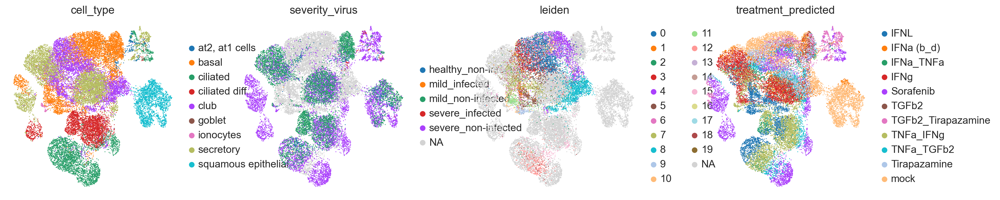

In [752]:
sc.pl.umap(feature_adata, color=['cell_type', 'severity_virus', 'leiden', 'infected_predicted'])

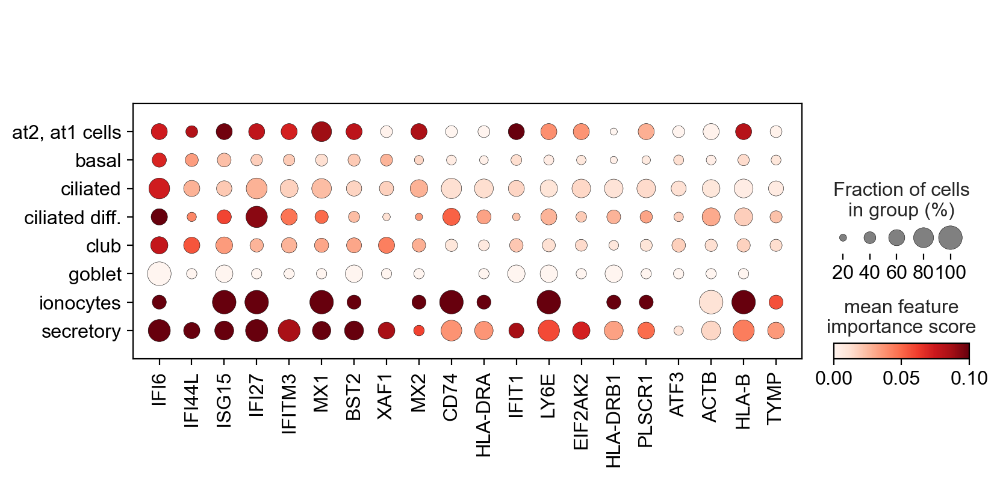

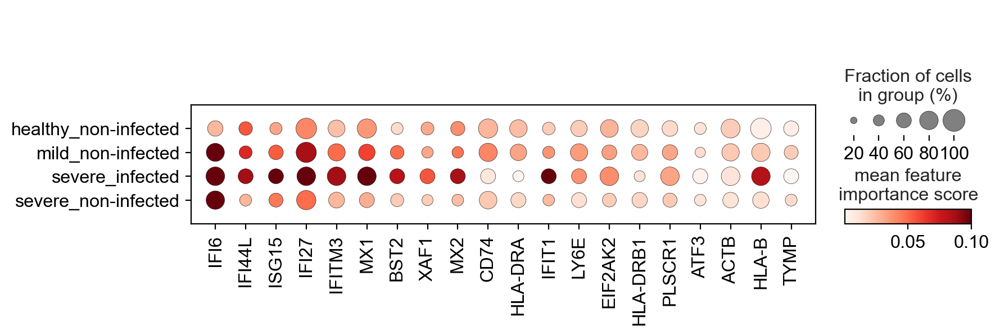

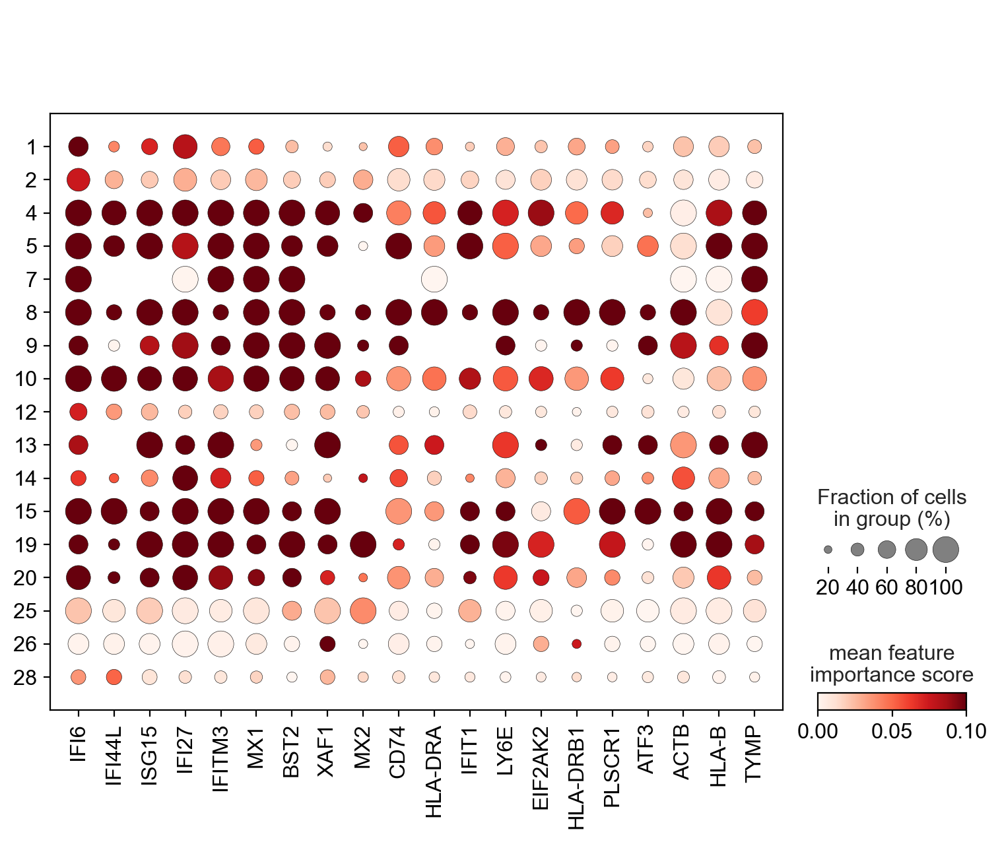

In [755]:
sig_genes = feature_adata.var.sort_values(by='sum', ascending=False).index[:20]
for gb in ['cell_type', 'severity_virus', 'leiden_merge']:
    sc.pl.dotplot(
        feature_adata[feature_adata.obs.infected_predicted == 'IFNL'],  # importance just for the IFNL label
        var_names=sig_genes, groupby=gb, layer='abs', colorbar_title='mean feature\nimportance score',
        vmax=.1
    )

We already see some significant genes like ISG15. Interpret the genes via enrichment.

In [817]:
enrich(list(sig_genes), feature_adata.var_names.to_list()).head(10)

,name,p_value,intersections
0,regulation of viral life cycle,1.125979e-11,"[ISG15, IFITM3, MX1, BST2, CD74, IFIT1, LY6E, ..."
1,defense response to symbiont,1.329081e-11,"[IFI6, IFI44L, ISG15, IFI27, IFITM3, MX1, BST2..."
2,regulation of viral process,1.329081e-11,"[ISG15, IFITM3, MX1, BST2, CD74, IFIT1, LY6E, ..."
3,defense response to virus,1.329081e-11,"[IFI6, IFI44L, ISG15, IFI27, IFITM3, MX1, BST2..."
4,viral life cycle,5.980927e-11,"[ISG15, IFI27, IFITM3, MX1, BST2, CD74, IFIT1,..."
5,immune response,1.999452e-10,"[IFI6, IFI44L, ISG15, IFI27, IFITM3, MX1, BST2..."
6,negative regulation of viral process,2.468603e-10,"[ISG15, IFITM3, MX1, BST2, IFIT1, LY6E, EIF2AK..."
7,response to virus,2.789084e-10,"[IFI6, IFI44L, ISG15, IFI27, IFITM3, MX1, BST2..."
8,biological process involved in interspecies in...,3.564374e-10,"[IFI6, IFI44L, ISG15, IFI27, IFITM3, MX1, BST2..."
9,viral process,6.337987e-10,"[ISG15, IFI27, IFITM3, MX1, BST2, CD74, IFIT1,..."


#### Sanity checks

Plot the expression of the top 3 genes on the original data.

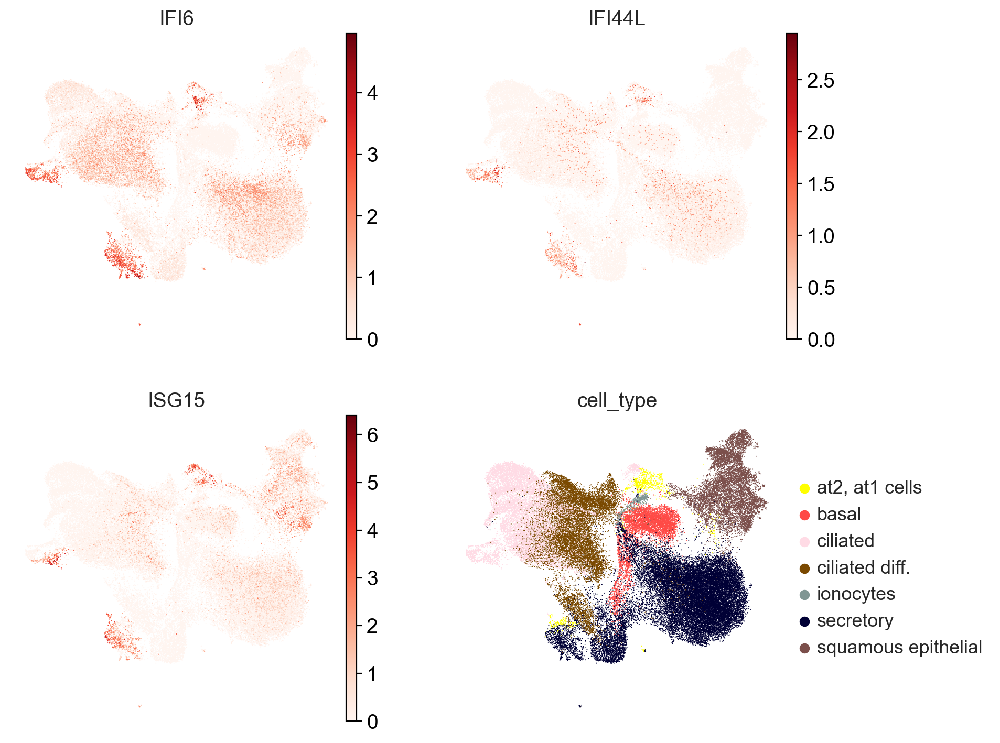

In [913]:
sc.pl.umap(fischer, color=['IFI6', 'IFI44L', 'ISG15', 'cell_type'], ncols=2, facecolor=None)

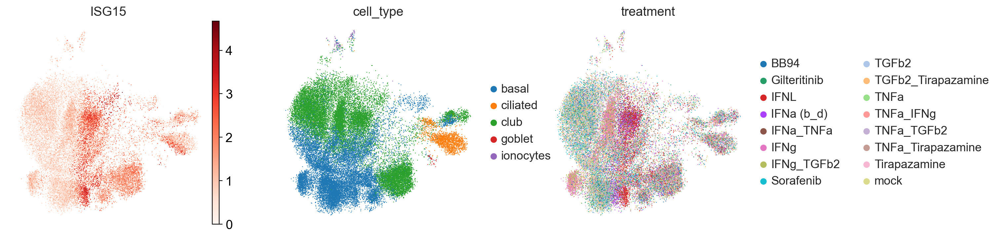

In [779]:
sc.pl.umap(covid, color=['ISG15', 'cell_type', 'treatment'])

This makes a lot of sense, as ISG15 is an IFNL marker. Let's look at the expression of these significant genes in the original fischer data and our dataset.

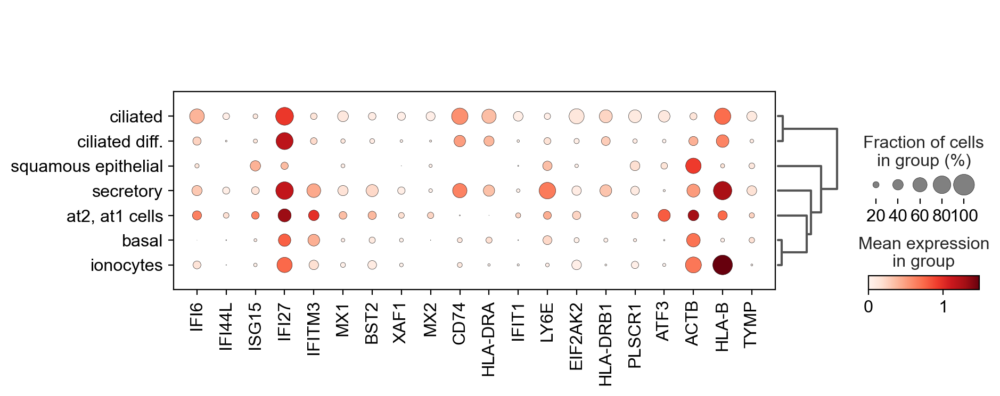

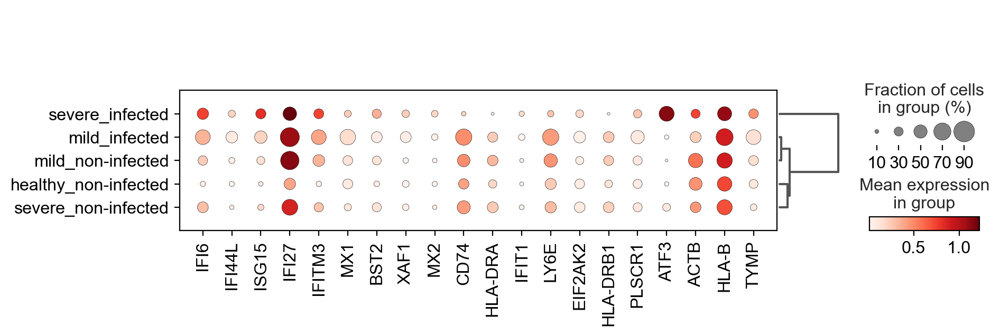

In [921]:
for gb in ['cell_type', 'severity_virus']:
#     sc.pl.stacked_violin(fischer, var_names=sig_genes, groupby=gb)
    sc.pl.dotplot(fischer, var_names=sig_genes, groupby=gb, dendrogram=True)

These genes should then be different in the bystanding population:

In [919]:
# reload bc subset
covid = sc.read('/storage/groups/ml01/workspace/yuge.ji/covid-perturbation/data/211001_annot_patient_integrated.h5ad')

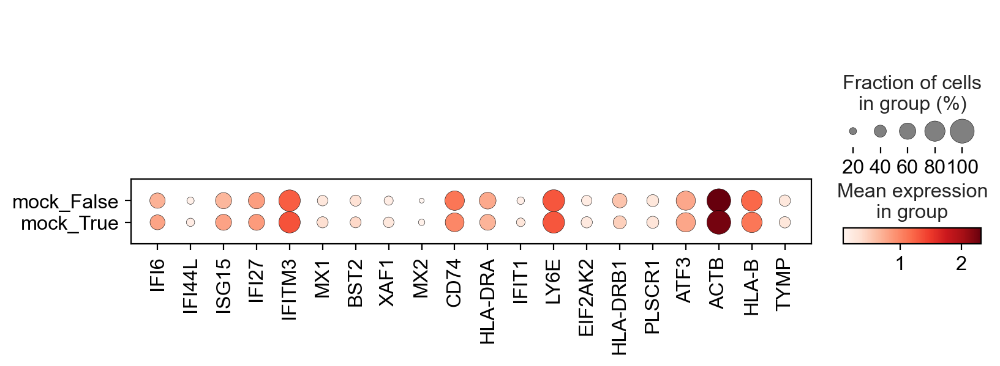

In [922]:
sc.pl.dotplot(covid[covid.obs.treatment.isin(['mock'])], var_names=sig_genes, groupby=['treatment', 'infected'])

#### differential feature importance

Let's see which features contributed most differently between subclusters.

In [797]:
feature_adata.var['fischer_sum'] = feature_adata[feature_adata.obs.batch_data == 'fischer'].layers['abs'].mean(axis=0)
feature_adata.var['covid_sum'] = feature_adata[feature_adata.obs.batch_data == 'patient_4'].layers['abs'].mean(axis=0)

In [798]:
feature_adata.var.sort_values(by='fischer_sum', ascending=False).head(10)

,used_for_scvi-0,highly_variable-1,coef,marker_genes,sum,fischer_sum,covid_sum
IFI6,True,False,-0.636020,True,378.710754,0.018354,0.009808
IFI27,True,True,-0.549109,True,170.010208,0.008488,0.003986
ISG15,True,True,-0.302745,True,174.785995,0.008484,0.004504
IFI44L,True,True,-1.065314,True,187.298584,0.007924,0.006785
IFITM3,True,True,-0.201340,True,150.913895,0.007654,0.003338
MX1,True,True,-0.453252,True,138.168716,0.006852,0.003318
CD74,True,False,0.054261,True,113.915131,0.006419,0.001443
BST2,True,False,-0.495083,True,135.003098,0.006237,0.004010
MX2,True,True,-0.353149,True,122.865860,0.005727,0.003564
HLA-DRA,True,True,0.262335,True,100.280952,0.005638,0.001292


In [799]:
feature_adata.var.sort_values(by='covid_sum', ascending=False).head(10)

,used_for_scvi-0,highly_variable-1,coef,marker_genes,sum,fischer_sum,covid_sum
IFI6,True,False,-0.636020,True,378.710754,0.018354,0.009808
IFI44L,True,True,-1.065314,True,187.298584,0.007924,0.006785
XAF1,True,False,-0.886310,True,130.886047,0.005416,0.004946
ISG15,True,True,-0.302745,True,174.785995,0.008484,0.004504
BST2,True,False,-0.495083,True,135.003098,0.006237,0.004010
IFI27,True,True,-0.549109,True,170.010208,0.008488,0.003986
MX2,True,True,-0.353149,True,122.865860,0.005727,0.003564
IFITM3,True,True,-0.201340,True,150.913895,0.007654,0.003338
MX1,True,True,-0.453252,True,138.168716,0.006852,0.003318
ATF3,True,True,0.314702,True,72.955582,0.003015,0.002764


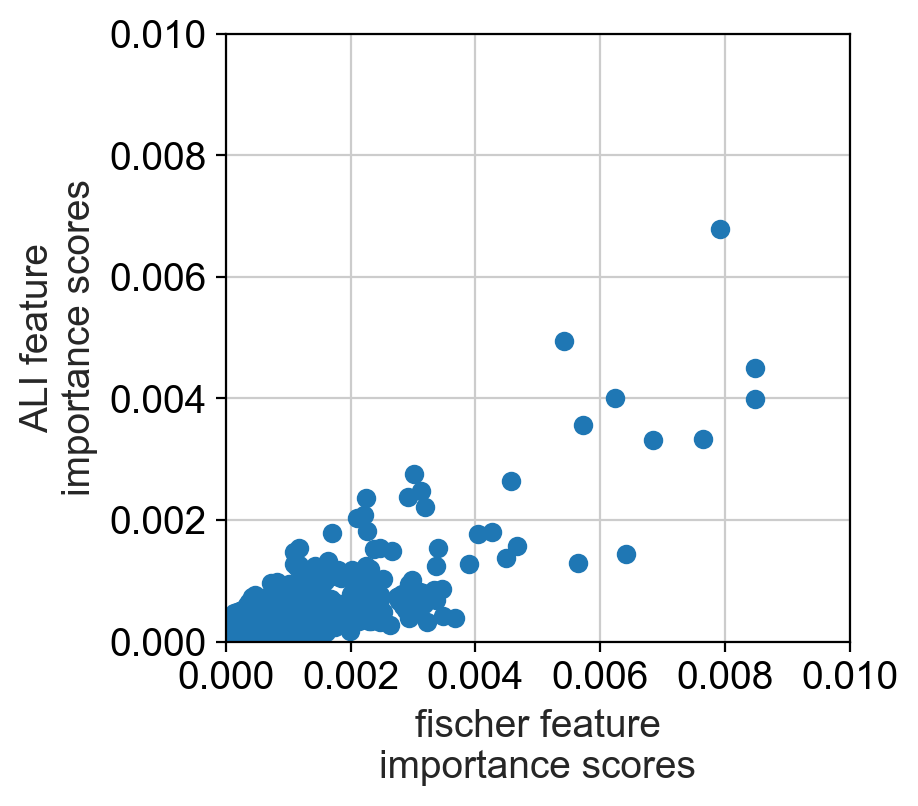

In [844]:
plt.scatter(feature_adata.var.fischer_sum.values, feature_adata.var.covid_sum.values)
max_value = max(max(feature_adata.var.fischer_sum.values), max(feature_adata.var.covid_sum.values))
plt.xlim(0, .01)
plt.ylim(0, .01)
plt.xlabel('fischer feature\nimportance scores')
plt.ylabel('ALI feature\nimportance scores');

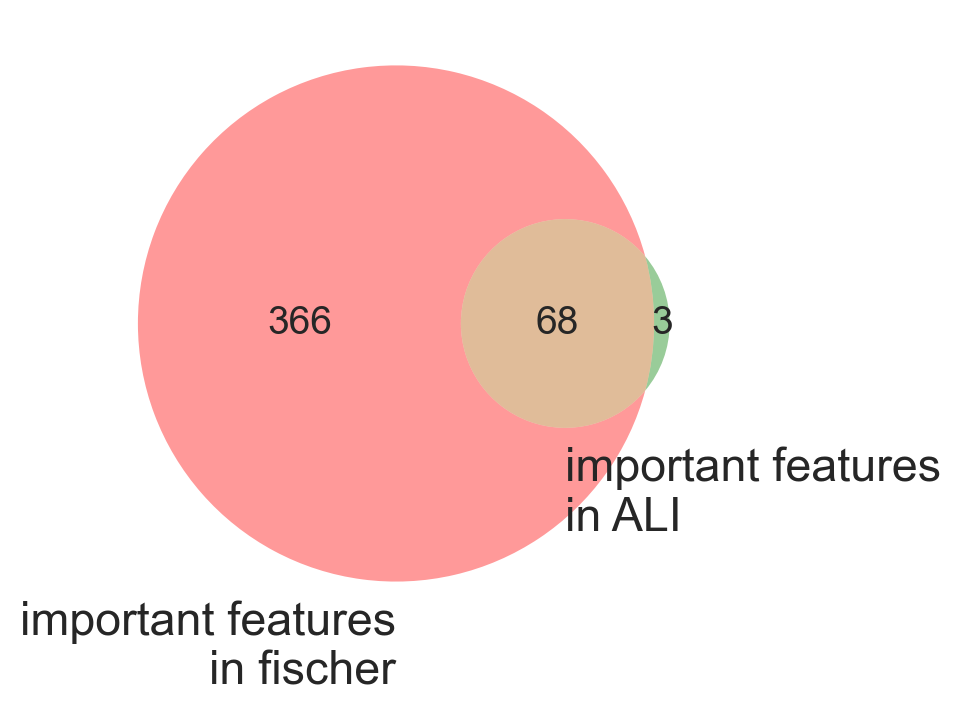

In [846]:
# set via threshold
thresh = np.quantile(list(feature_adata.var.fischer_sum.values) + list(feature_adata.var.covid_sum.values), .95)
fischer_genes = set(feature_adata.var[feature_adata.var['fischer_sum'] > thresh].index)
covid_genes = set(feature_adata.var[feature_adata.var['covid_sum'] > thresh].index)

# take top n
# fischer_genes = set(feature_adata.var.sort_values(by='fischer_sum', ascending=False).index[:25])
# covid_genes = set(feature_adata.var.sort_values(by='covid_sum', ascending=False).index[:25])

venn2([fischer_genes, covid_genes], set_labels=['important features\nin fischer', 'important features\nin ALI'])

In [838]:
# in both
enrich(fischer_genes & covid_genes, feature_adata.var_names).head()

,name,p_value,intersections
0,response to external biotic stimulus,2.650357e-22,"[IFI27, NFE2L2, IFITM3, HLA-B, IFI6, B2M, PARP..."
1,response to other organism,2.650357e-22,"[IFI27, NFE2L2, IFITM3, HLA-B, IFI6, B2M, PARP..."
2,response to biotic stimulus,3.644420e-22,"[IFI27, NFE2L2, IFITM3, HLA-B, IFI6, B2M, PARP..."
3,biological process involved in interspecies in...,5.139887e-22,"[IFI27, NFE2L2, IFITM3, HLA-B, IFI6, B2M, PARP..."
4,defense response to other organism,2.511608e-20,"[IFI27, NFE2L2, IFITM3, HLA-B, IFI6, PARP14, O..."


In [839]:
# in fischer but not covid
enrich(fischer_genes - covid_genes, feature_adata.var_names).head()

,name,p_value,intersections
0,cytoplasmic translation,2.932948e-10,"[RPS2, EIF3K, RPS6, RPS23, EIF4A1, RPL10A, RPL..."
1,oxidative phosphorylation,3.407652e-06,"[NDUFB4, COX7A2L, VCP, MT-CO1, MT-CO2, MT-ATP6..."
2,response to chemical,4.942184e-06,"[IFI16, NET1, ID1, CLU, PSMB9, ASS1, NPM1, PRD..."
3,cellular response to chemical stimulus,1.225924e-05,"[IFI16, NET1, ID1, CLU, PSMB9, ASS1, NPM1, PRD..."
4,mitochondrial ATP synthesis coupled electron t...,1.225924e-05,"[NDUFB4, COX7A2L, MT-CO1, MT-CO2, CYCS, MT-CO3..."


In [840]:
enrich(covid_genes - fischer_genes, feature_adata.var_names).head()

,name,p_value,intersections
0,regulation of multicellular organismal develop...,0.017127,"[TRIB1, WARS1, CCN2]"
1,regulation of phosphorylation,0.017127,"[TRIB1, WARS1, CCN2]"
2,regulation of eosinophil differentiation,0.017127,[TRIB1]
3,positive regulation of eosinophil differentiation,0.017127,[TRIB1]
4,regulation of protein modification process,0.017127,"[TRIB1, WARS1, CCN2]"


Visualize how these genes changed in the actual data.

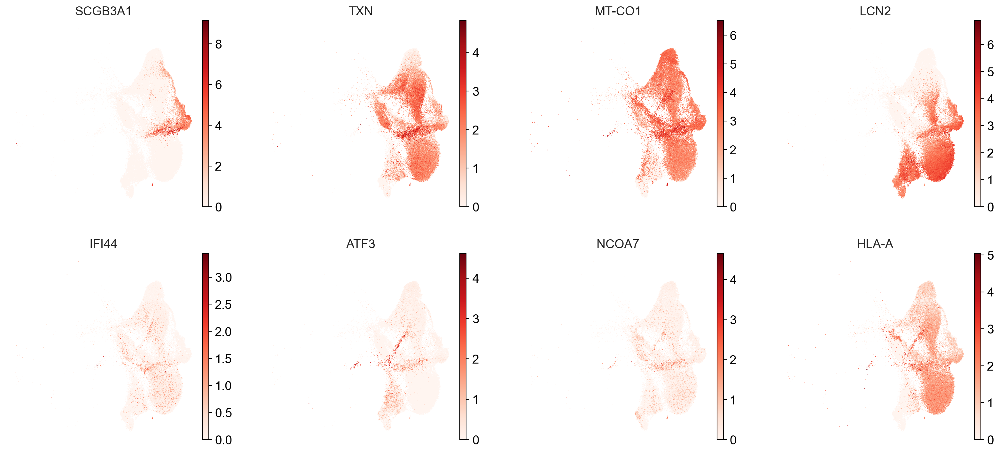

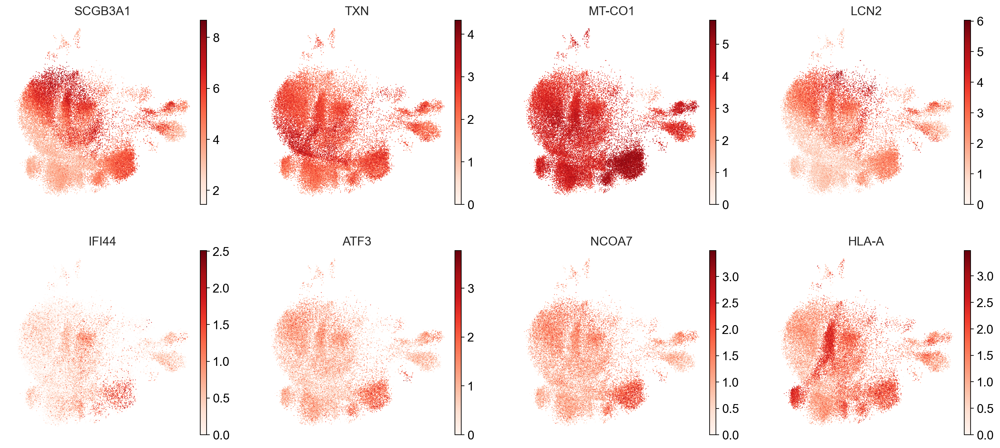

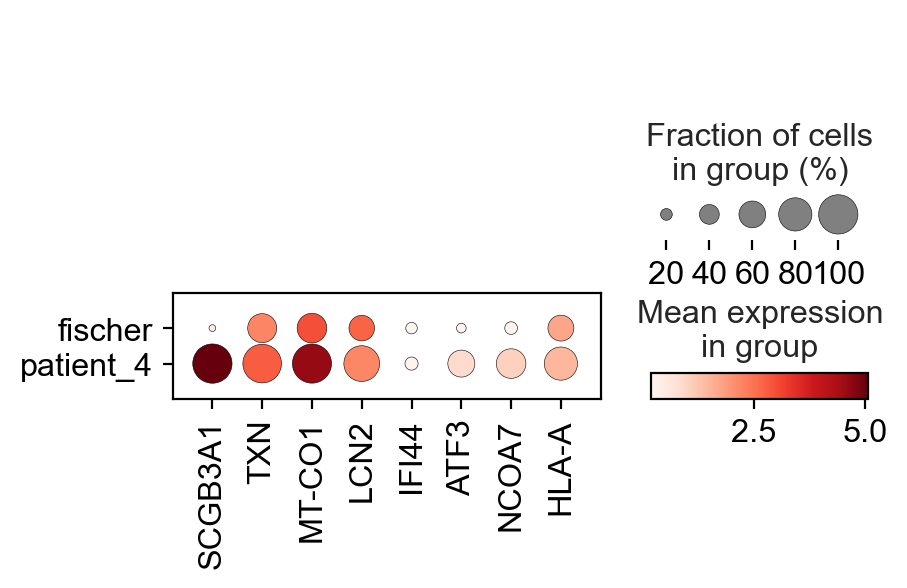

In [836]:
genes = list(fischer_genes - covid_genes)[:4] + list(covid_genes - fischer_genes)[:4]
for a in [fischer, covid]:
    sc.pl.umap(a, color=genes, ncols=4)
# sanity check
sc.pl.dotplot(adata, var_names=genes, groupby='batch_data')